# Test scene SCEPS - Polar scene
We perform the same comparison for the SCEPS polar test scene.

Then we read again the input and apply the retrieval to that data for comparison. Since the format of the sceps input scene is slightly different, we have another reading routine for this dataset.

In [2]:
using Revise
includet("common_functions.jl")

  Activating project at `/mnt/pharoshome/huntemann/Projects/DEVALGO/MultiParameter_ATBD_V2/algorithm/algoenv`


In [2]:
data=Dict()
scenep=Dict()
for dir in ["forward","backward"]
    test2datac,test2errorc,lat,lon=project_data(fns.scenep.l1b,"C_BAND",dir,oza_corr=true)
    x,y=lltoxy.(lat,lon) |> x-> (first.(x),last.(x))
    dat,errr,res,its=run_oem(test2datac)
    data[dir]=NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss)}(OEM.project_data_to_area_nn(dat[:,i],lat,lon,lea) for i in 1:9)
    scenep[dir]=(;dat, errr, res, lat, lon,x,y,its)
end

Here we can discuss the results of the multi parameter retrieval on a the polar scene and give some interpretation of the results. We are lookingn into the combined results from the forward and backward scans. Since we use a simplistic near-neighbour approach, we expect some noise in the results, where the retrieval on the forward and backward scans do not match well. Three different quantities are shown here
- the retrieved parameters {numref}`retrieval_polar_combined`
- the uncertainty of the retrieval {numref}`uncertainty_polar_combined`
- the improvement of our knowledge of the parameters (one minus square root of diagonal of the covariance matrix) {numref}`improvement_polar_combined`

The results are shown in the following plots.

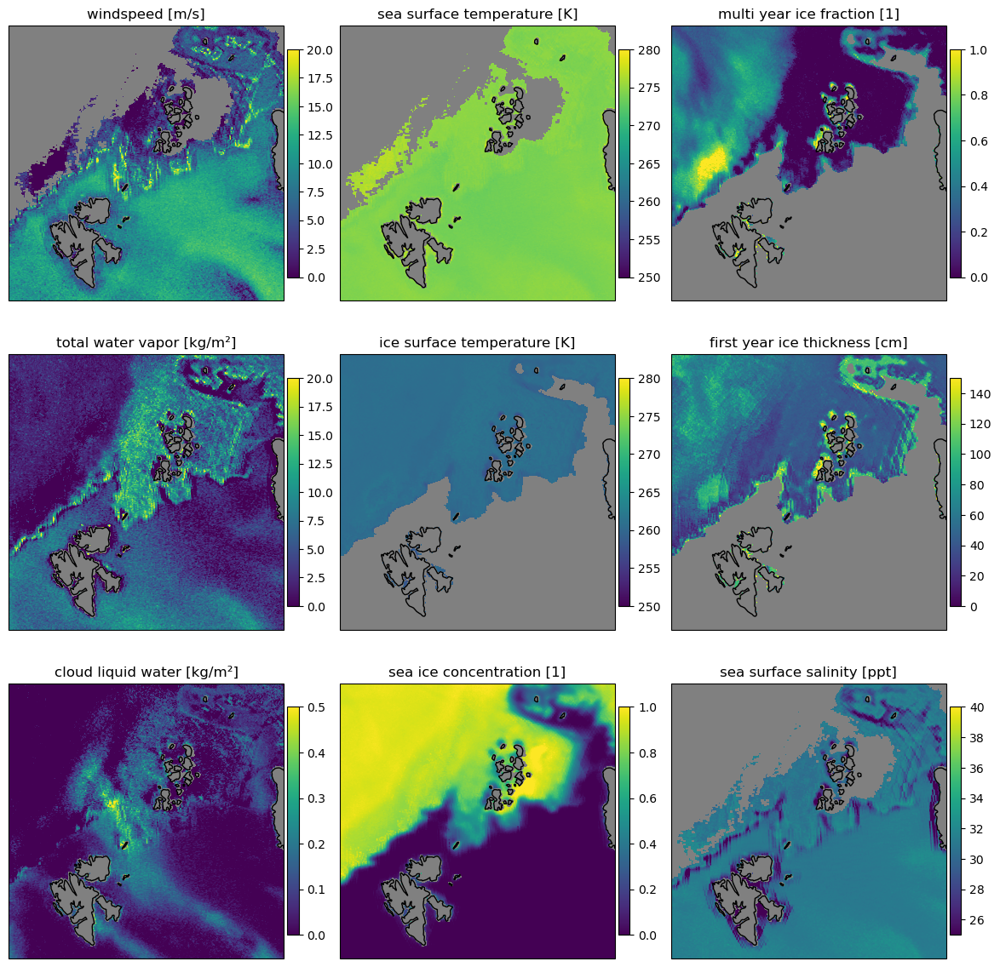

~~~markdown
```{figure} figures/figure_retrieval_polar_combined.png
:name: retrieval_polar_combined

Retrieval results for the nine parameters for the combined forward and backward scans for the SCEPS polar scene.
```

~~~

In [3]:
let dir="combined"
    fig=plot_all_params(scenep,dir, swath=false,mask=(:sic,:land),errors=:false)
    description="Retrieval results for the nine parameters for the combined forward and backward scans for the SCEPS polar scene."
    plot_with_caption(fig,description,"retrieval_polar_combined")
end

The quantities are reasonable, while some have a bit more noise and others are more stable. The {term}`SIC` is very smooth with little noise which is expected as it has the highest influence on the brightness temperatures. {term}`SSS`, {term}`IST` and {term}`SST` look flat, as if not the real variability of these variables is preserved. This is due to the fact that the retrieval is not very sensitive to these parameters. The {term}`SI`C is the most important parameter for the retrieval and the other parameters are more relying on the apri ori data. The uncertainty of the retrieval is quite high for the {term}`SSS`, {term}`IST` and {term}`SST`, while it is low for the {term}`SIC`. This can be seen when we plot the uncertainty of the retrieval below.

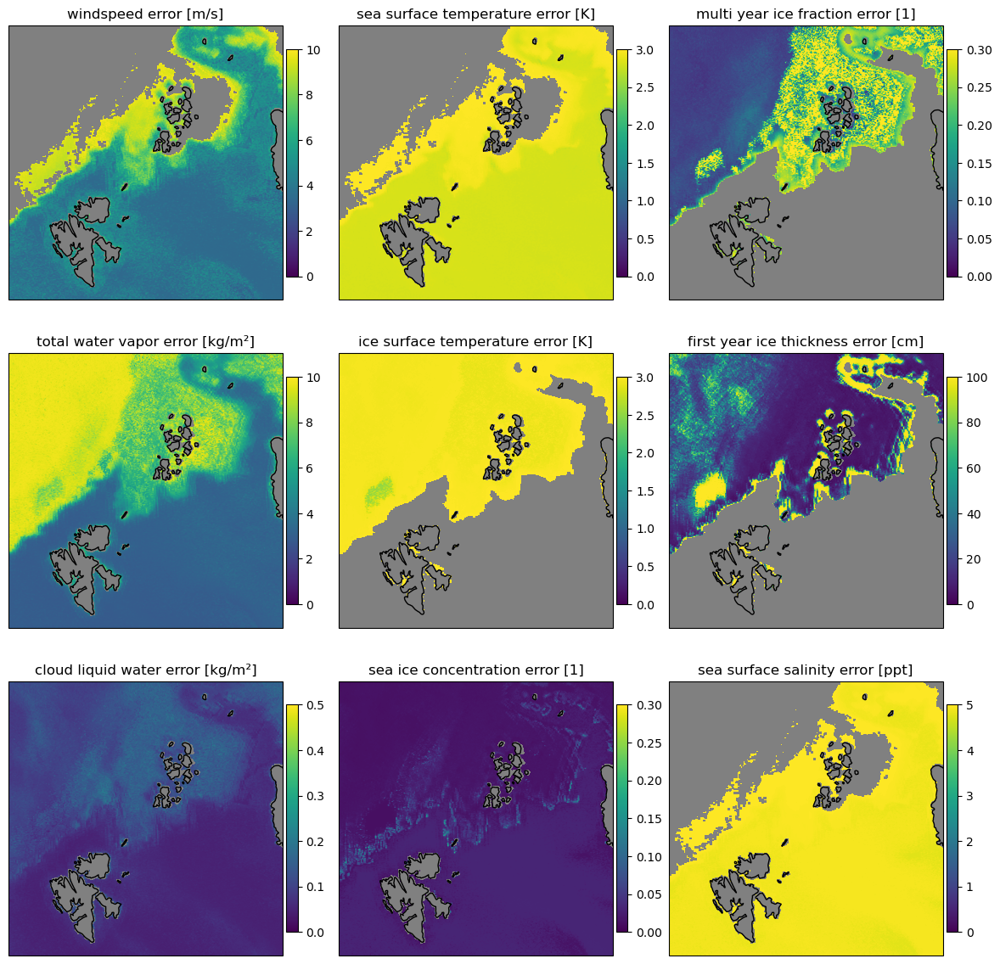

~~~markdown
```{figure} figures/figure_uncertainty_polar_combined.png
:name: uncertainty_polar_combined

Retrieval uncertainty for the nine parameters for the combined forward and backward scans for the SCEPS polar scene.
```

~~~

In [4]:
let dir="combined"
    fig=plot_all_params(scenep,dir, swath=false,mask=(:sic,:land),errors=:true)
    description="Retrieval uncertainty for the nine parameters for the combined forward and backward scans for the SCEPS polar scene."
    plot_with_caption(fig,description,"uncertainty_polar_combined")
end

The comparison to the prior uncertainty shows that the retrieval improves our knowledge of the parameters. The improvement is highest for the {term}`SIC` except over the ice edge, while it is lowest for the {term}`IST` and {term}`SSS` as these variables have little influence on the resulting TBs compared to the others. Also the {term}`CLW` and the {term}`SIT` was show a good improvement of our knowledge by performing the retrieval.

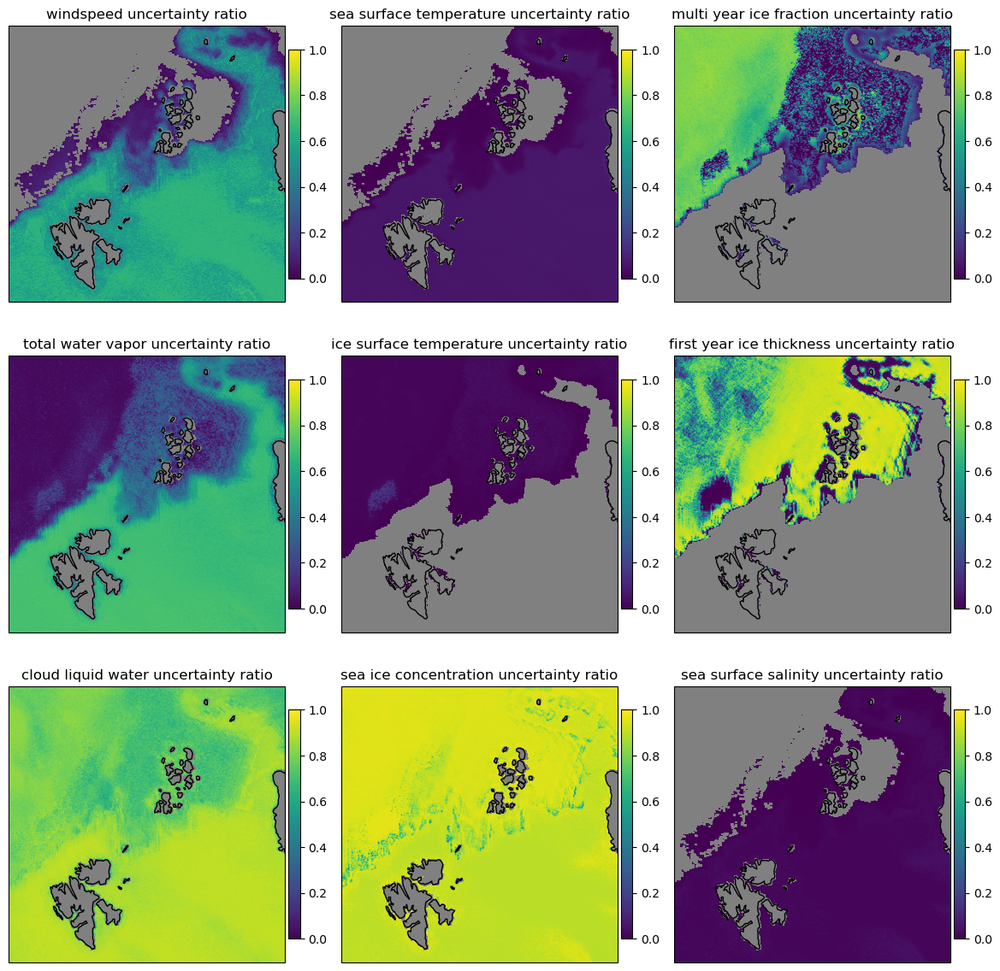

~~~markdown
```{figure} figures/figure_improvement_polar_combined.png
:name: improvement_polar_combined

Retrieval knowledge improvement for the nine parameters for the combined forward and backward scans for the SCEPS polar scene. Zeros means no improvement over prior, while ones means vast improvement.
```

~~~

In [5]:
let dir="combined"
    fig=plot_all_params(scenep,dir, swath=false,mask=(:sic,:land),errors=:ratio)
    description="Retrieval knowledge improvement for the nine parameters for the combined forward and backward scans for the SCEPS polar scene. Zeros means no improvement over prior, while ones means vast improvement."
    plot_with_caption(fig,description,"improvement_polar_combined")
end

Next we do a comparison to the retrieval on the *input* data to the satellite simulator is done. This is done to show that the retrieval is able to retrieve the parameters from the input data. We do not explicitly compare all variables here for the retrieval on input and output data of the simulator.

In [6]:
gdatap = let
    stest,_,imextent=OEM.read_testscene_sceps(fns.scenep.input)
    tdat,terr,tres=run_oem(deepcopy(stest))

    NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss)}(
        let cdat=reshape(tdat[:,i],1400,1400)|>rotl90 #somehow the data is rotated
            cdat[landmask].=NaN
            cdat
        end for i in 1:9)
end;

As an example, we discuss the {term}`SIC` from the retrieval and compare between the retrieval applied to the input data and the L1b data. The difference is very small as expected, as the simulator is only adding noise and a smearing of the footprints to the data. The difference is only visible at the ice edges and at the intermediate ice concentration where slight scan pattern are visible from the simulated L1b data.

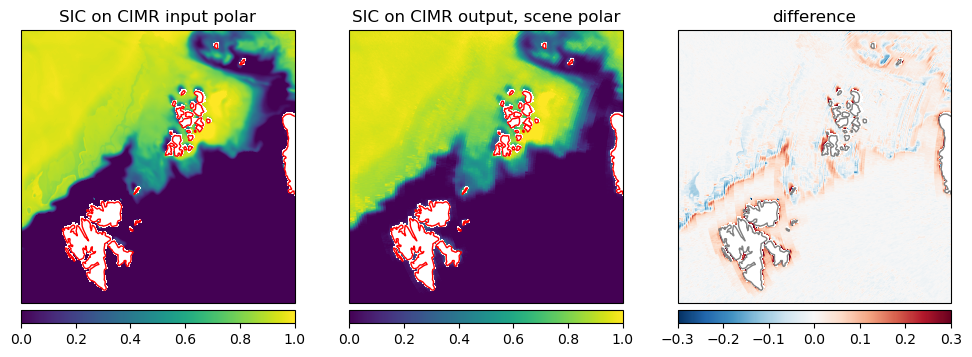

~~~markdown
```{figure} figures/figure_SIC_comparison_polar.png.png
:name: SIC_comparison_polar.png

SIC comparison between CIMR input and output for scene polar, SIC on CIMR input TBs (left), SIC on CIMR output, the L1b (middle), their difference (right)
```

~~~

In [7]:
let fig = pyplot.figure(figsize=(12, 8))
    scene="polar"
    ax = fig.add_subplot(131, projection=ccrs)
    ax.set_title("SIC on CIMR input $scene")
    im=ax.imshow(gdatap.sic,zorder=1,extent=leaextent,vmin=0,vmax=1)
    ax.coastlines(color="red")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)

    ax = fig.add_subplot(132, projection=ccrs)
    ax.set_title("SIC on CIMR output, scene $scene")

    outsic=data["forward"].sic
    outsic[landmask].=NaN
    im=ax.imshow(outsic, vmin=0, vmax=1, extent=leaextent, transform=ccrs)
    ax.coastlines(color="red")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)

    ax = fig.add_subplot(133, projection=ccrs)
    ax.set_title("difference")
    im=ax.imshow(data["forward"].sic.-gdatap.sic, vmin=-0.3, vmax=0.3, extent=leaextent, transform=ccrs,cmap="RdBu_r")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)

    ax.coastlines(color="gray")
    plot_with_caption(fig,"SIC comparison between CIMR input and output for scene $scene, SIC on CIMR input TBs (left), SIC on CIMR output, the L1b (middle), their difference (right)", "SIC_comparison_$scene.png")
end

Analog to the other scenes, we calculate the performance of the retrieval on the input data and the L1b data. The combined results for forward and backward scan are in table {numref}`performance-polar-combined`, as expected the results are between the forward and backward scan results. Here we did not remove the border pixels from the comparison, as the SCEPS polar scene does not have a 0 K border as the other scenes. The table shows the smallest mean difference (bias) in SIC, CLW and MYI, while the other variables also show good performance. The standard deviation of the difference is a measure of how far the results spread around the mean difference. TWV and WS show very high values, but also the SSS and SIT values are quite large. The SIC as the value with the smallest bias, also has very low spread.

In [8]:
calculate_overall_performances([scenep], [gdatap], ["combined"], [1]) |> x-> markdown_table(x,"scene 1","polar-combined") |> x -> display("text/markdown",x) 

AssertionError: AssertionError: direction in ["forward", "backward", "combined"]

We are loading the SCEPS polar scene reference geophysical data for comparison. It is already in EASE2 projection with the same grid as the reference brightness temperatures.

In [9]:

gdata_true,latt,lont = let
     #fn="/home/huntemann/CIMR_L1X/cimr_sceps_geo_card_polarscene_1_20161217_v1p0_part1.nc"
    fn="/mnt/spaces/Projects/2022_CIMR-DEVALGO/cimr_sceps_geo_card_devalgo_polarscene_1_20161217_harmonised_v2p0_surface.nc"


    NamedTuple{(:ws, :twv, :clw, :sst, :ist, :sic, :myi, :sit, :sss, :snd, :fdn)}((
    (((NCDataset(fn)["surface_wind_u"][:,:,1]).^2f0
    .+(NCDataset(fn)["surface_wind_v"][:,:,1]).^2f0).^(0.5f0))[end:-1:1,:],
    NCDataset(fn)["total_column_water_vapour"][:,:,1][end:-1:1,:],
    NCDataset(fn)["total_column_liquid_water"][:,:,1][end:-1:1,:],
    NCDataset(fn)["sea_surface_temperature"][:,:,1][end:-1:1,:],
    NCDataset(fn)["sea_ice_temperature"][:,:,1][end:-1:1,:],
    NCDataset(fn)["sea_ice_concentration"][:,:,1][end:-1:1,:]/100.0f0,
    NCDataset(fn)["sea_ice_type"][:,:,1][end:-1:1,:], #1=multiyear, 0=first year (or no ice)
    NCDataset(fn)["sea_ice_thickness"][:,:,1][end:-1:1,:]*100.0f0,
    
    NCDataset(fn)["sea_surface_salinity"][:,:,1][end:-1:1,:],
    NCDataset(fn)["snow_thickness"][:,:,1][end:-1:1,:]*100.0f0,
    NCDataset(fn)["freezing_days_number"][:,:,1][end:-1:1,:]
    )),
    NCDataset(fn)["latitude"][:,:,1][end:-1:1],
    NCDataset(fn)["longitude"][:,:,1][end:-1:1]
end;

Here we get an overview over the reference values of the SCEPS polar scene.

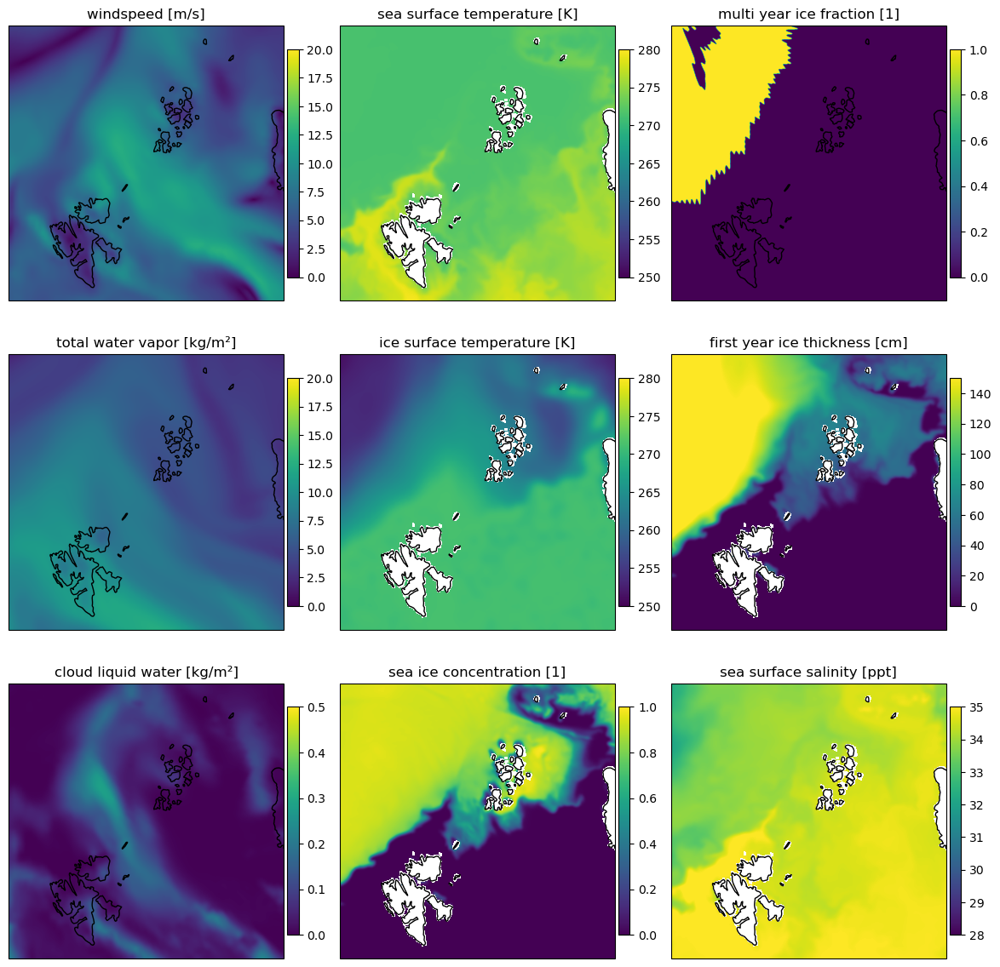

~~~markdown
```{figure} figures/figure_sceps_polar_reference.png
:name: sceps_polar_reference

SCEPS Polar scene reference geophysical data for the nine variables which are also used in the multi parameter retrieval.
```

~~~

In [10]:
#overview plot of all gdata_true variables 3x3 grid
mmdict=Dict("ws"=>[0,20],"twv"=>[0,20],"clw"=>[0,0.5],"sst"=>[250,280],"ist"=>[250,280],"sic"=>[0,1],"myi"=>[0,1],"sit"=>[0,150],"sss"=>[28,35], "snd"=>[0,50],"fdn"=>[0,100])
#variable names and units
labdict=Dict("ws"=>"wind speed [m/s]","twv"=>"total water vapor [kg/m²]","clw"=>"cloud liquid water [kg/m²]","sst"=>"sea surface temperature [K]","ist"=>"ice surface temperature [K]","sic"=>"sea ice concentration [1]","myi"=>"multi year ice fraction [1]","sit"=>"first year ice thickness [cm]","sss"=>"sea surface salinity [ppt]", "snd"=>"snow thickness [cm]","fdn"=>"freezing days number [1]")

fig,ax=pyplot.subplots(nrows=3,ncols=3,figsize=[15,15],subplot_kw=PyDict(Dict("projection"=> ccrs)))
ax=pyconvert(Array,ax)[:]

for (i,varname) in enumerate(Symbol.(("ws","twv","clw","sst","ist","sic","myi","sit","sss")))
    mins,maxs = mmdict[string(varname)]
    pos=ax[i].imshow(getfield(gdata_true,varname),extent=leaextent,vmin=mins,vmax=maxs,cmap="viridis",transform=ccrs)
    cb=fig.colorbar(pos,ax=ax[i],shrink=0.7,orientation="vertical",pad=0.01)
    ax[i].set_title(labdict[string(varname)])
    #ax[i].set_extent(extent,mycrs)
    ax[i].coastlines()
end
pyplot.subplots_adjust(wspace=0.01,hspace=0.01)
#display("image/png",fig)
plot_with_caption(fig, "SCEPS Polar scene reference geophysical data for the nine variables which are also used in the multi parameter retrieval.", "sceps_polar_reference")

Here we perform a comparison of the SCEPS polar scene reference data to the retrieval performed on L1b data. 

* Wind Speed (WS): A similar pattern is visible in both datasets. The retrieval shows a little higher values in general.
* Total Water Vapor (TWV): The pattern is similar, but the retrieval shows lower values in general. The retrieval shows discontinuity over the ice edge.
* Cloud Liquid Water (CLW): The pattern is similar, also the absolute range of values is similar. The retrieval shows a discontinuity over the ice edge.
* Sea Surface Temperature (SST): The retrieval seems uniformly retrieving similar values close to the freezing point while the reference data shows more variation and higher temperatures.
* Ice Surface Temperature (IST): The retrieval shows quite high values around the freezing point uniformly, while the reference data shows much lower temperatures closer towards the North pole.
* Sea Ice Concentration (SIC): The retrieval shows a similar pattern as the reference data, but lower values at the ice edge. 
* Multi Year Ice Fraction (MYIF): The reference data is binary (multiyear ice or not). All multiyear ice according to the reference is retrieved as increased multiyear ice fraction between 0.6 and 1.0, while the first year ice is retrieved as 0.0 as expected.
* First Year Ice Thickness (SIT): The comparable first year ice area shows similar sea ice thickness, while the retrieval shows slightly lower values.
* Sea Surface Salinity (SSS): The retrieval shows lower values close to the a priori value of 30ppt while the reference data has mostly values around 35ppt.

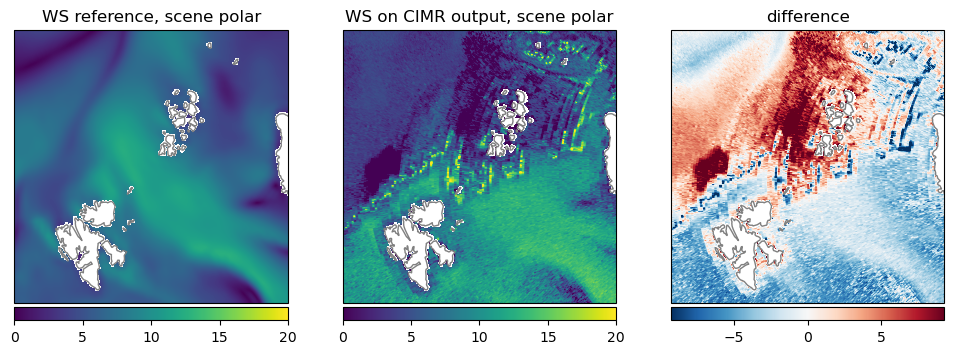

~~~markdown
```{figure} figures/figure_ref_comparison_ws.png
:name: ref_comparison_ws

Comparison of WS between reference dataset and retrieval
```

~~~

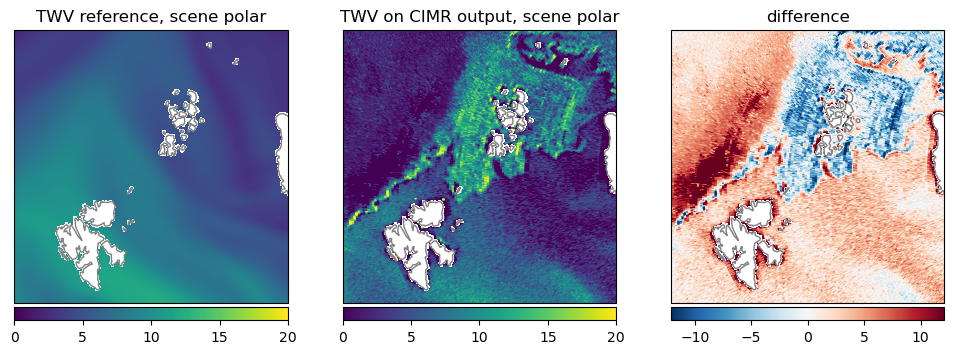

~~~markdown
```{figure} figures/figure_ref_comparison_twv.png
:name: ref_comparison_twv

Comparison of TWV between reference dataset and retrieval
```

~~~

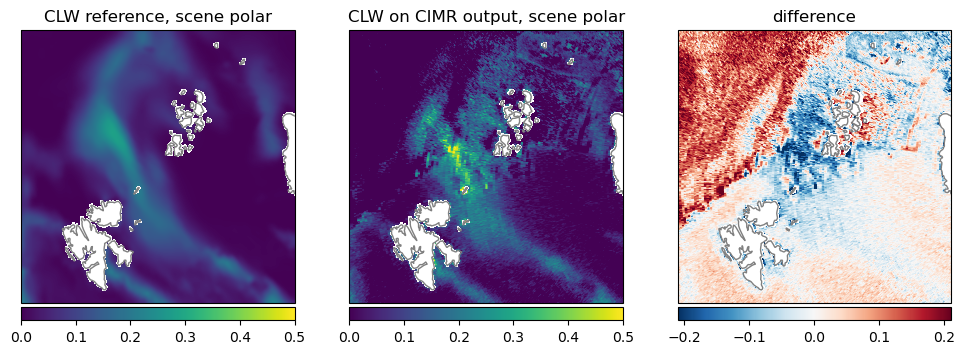

~~~markdown
```{figure} figures/figure_ref_comparison_clw.png
:name: ref_comparison_clw

Comparison of CLW between reference dataset and retrieval
```

~~~

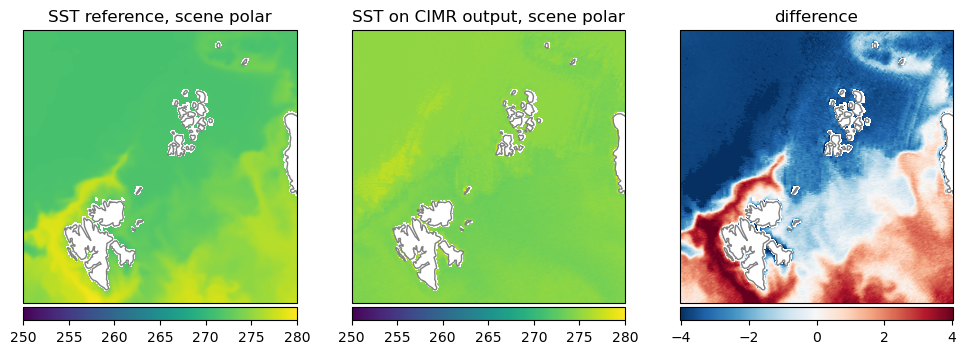

~~~markdown
```{figure} figures/figure_ref_comparison_sst.png
:name: ref_comparison_sst

Comparison of SST between reference dataset and retrieval
```

~~~

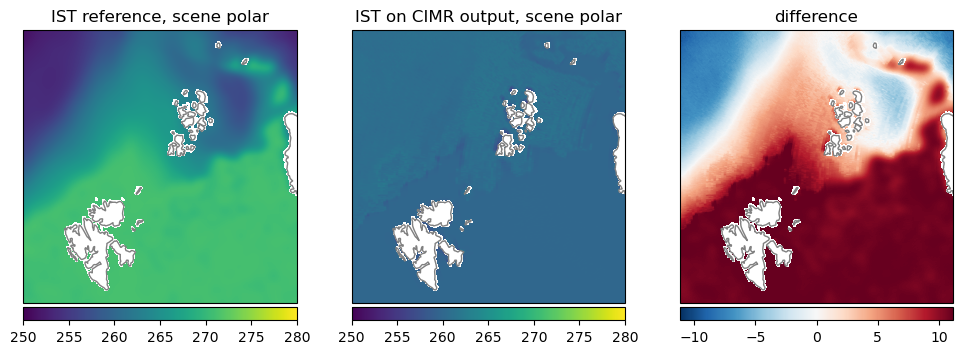

~~~markdown
```{figure} figures/figure_ref_comparison_ist.png
:name: ref_comparison_ist

Comparison of IST between reference dataset and retrieval
```

~~~

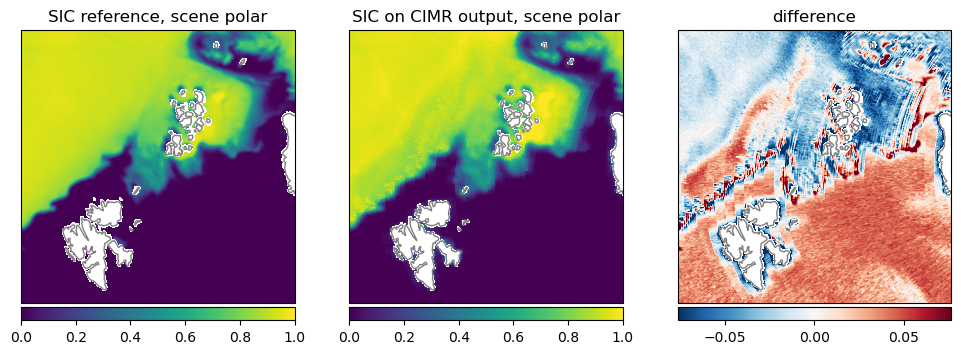

~~~markdown
```{figure} figures/figure_ref_comparison_sic.png
:name: ref_comparison_sic

Comparison of SIC between reference dataset and retrieval
```

~~~

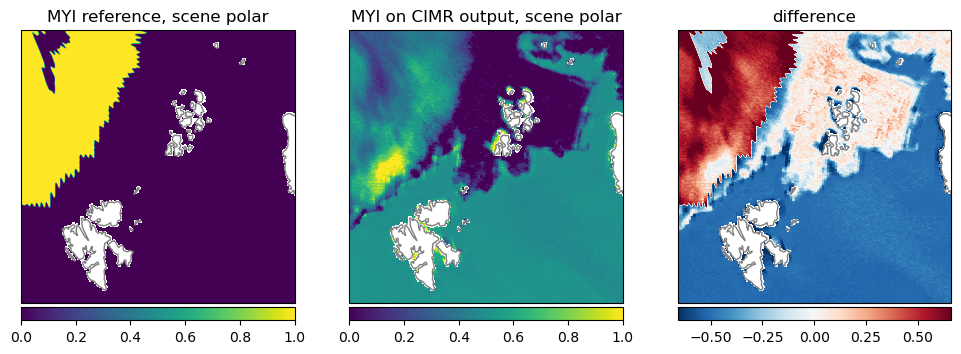

~~~markdown
```{figure} figures/figure_ref_comparison_myi.png
:name: ref_comparison_myi

Comparison of MYI between reference dataset and retrieval
```

~~~

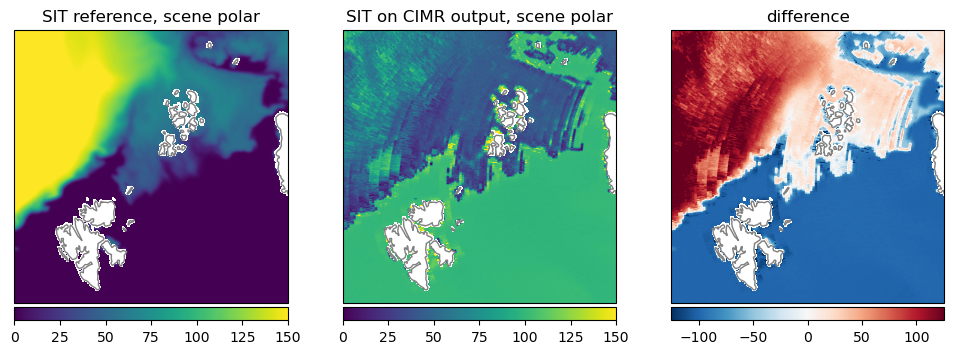

~~~markdown
```{figure} figures/figure_ref_comparison_sit.png
:name: ref_comparison_sit

Comparison of SIT between reference dataset and retrieval
```

~~~

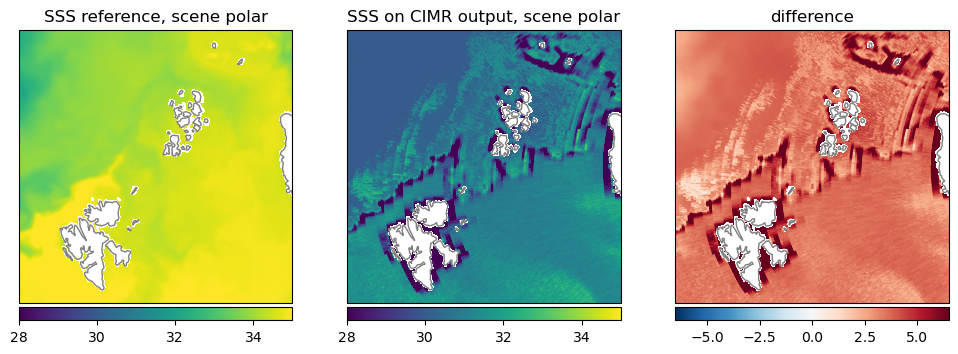

~~~markdown
```{figure} figures/figure_ref_comparison_sss.png
:name: ref_comparison_sss

Comparison of SSS between reference dataset and retrieval
```

~~~

In [12]:

#varname="twv"
dir="forward"
for varname in ["ws","twv","clw","sst","ist","sic","myi","sit","sss"]
    mins,maxs = mmdict[varname]
    fig = pyplot.figure(figsize=(12, 4.5))
    scene="polar"
    #fig.suptitle(labdict[varname])

    #left plot
    ax = fig.add_subplot(131, projection=ccrs)
    ax.set_title("$(uppercase(varname)) reference, scene $scene")
    truedat=getfield(gdata_true,Symbol(varname))
    truedat[landmask].=NaN
    im=ax.imshow(truedat, vmin=mins, vmax=maxs, extent=leaextent, transform=ccrs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)
   
    #center plot
    ax = fig.add_subplot(132, projection=ccrs)
    ax.set_title("$(uppercase(varname)) on CIMR output, scene $scene")
    retrdat = getfield(data["forward"],Symbol(varname))
    retrdat[landmask].=NaN
    im=ax.imshow(retrdat,zorder=1,extent=leaextent,vmin=mins,vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)

    #right plot
    ax = fig.add_subplot(133, projection=ccrs)
    ax.set_title("difference")
    diffs=getfield(gdata_true,Symbol(varname)).-getfield(data[dir],Symbol(varname))
    diffmax=quantile(filter(!isnan,abs.(diffs)[:]) ,0.95)
    im=ax.imshow(diffs, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs,cmap="RdBu_r")
    pyplot.colorbar(im,orientation="horizontal",pad=0.01)

    ax.coastlines(color="gray")
    plot_with_caption(fig, "Comparison of $(uppercase(varname)) between reference dataset and retrieval", "ref_comparison_$(varname)")
    #display("image/png",fig)
end

A summary of the performance of the retrieval on the L1b data compared to the reference dataset, i.e. mean difference (BIAS) and RMSD is shown in table {numref}`polar-truth-combined`. For the different variables and observation directions. The results for the combined directions between the individual forward and backward scan results. The mean difference (BIAS) is very small for the SIC, CLW and MYI, while the other variables also show good performance. The standard deviation of the difference is a measure of how far the results spread around the mean difference. TWV and WS show very high values, but also the SSS and SIT values are quite large. The SIC as the value with the smallest bias, also has very low spread.

In [13]:
calculate_overall_performances([scenep], [gdata_true], ["forward","backward","combined"], [1]) |> x-> markdown_table(x,"multi parameter retrieval on the SCEPS polar scene","polar-truth-combined") |> x->display("text/markdown",Markdown.parse(x)) 

````markdown
```{list-table} Performance metric for multi parameter retrieval on the SCEPS polar scene
:name: "performance-polar-truth-combined"
:header-rows: 1

# table content (skipped in notebook) ```
````

| Variable | fw mean(diff) | fw std(diff) | bw mean(diff) | bw std(diff) | cb mean(diff) | cb std(diff) |
| --------:| -------------:| ------------:| -------------:| ------------:| -------------:| ------------:|
|       WS |         0.128 |        4.727 |         0.045 |        4.717 |         0.080 |        4.724 |
|      TWV |        -1.915 |        5.743 |        -2.031 |        5.781 |        -1.984 |        5.756 |
|      CLW |        -0.017 |        0.098 |        -0.016 |        0.097 |        -0.017 |        0.097 |
|      SST |         1.452 |        2.395 |         1.458 |        2.402 |         1.456 |        2.400 |
|      IST |        -5.467 |        6.178 |        -5.470 |        6.174 |        -5.469 |        6.176 |
|      SIC |        -0.001 |        0.054 |        -0.000 |        0.054 |        -0.001 |        0.052 |
|      MYI |         0.179 |        0.415 |         0.180 |        0.415 |         0.180 |        0.415 |
|      SIT |        22.468 |       85.845 |        22.929 |       85.745 |        22.724 |       85.796 |
|      SSS |        -3.797 |        1.428 |        -3.819 |        1.452 |        -3.808 |        1.440 |


For a better insight into the different comparisons, namely, the retrieval on the Simulator input and the reference data, we illustrate a comparison of the SIC for the forward and backward scan in the following plots. The comparison of the retrieval on the input data and the reference data shows a very small difference, as expected. The difference is only visible at the ice edges and at the intermediate ice concentration where slight scan pattern are visible from the simulated L1b data.

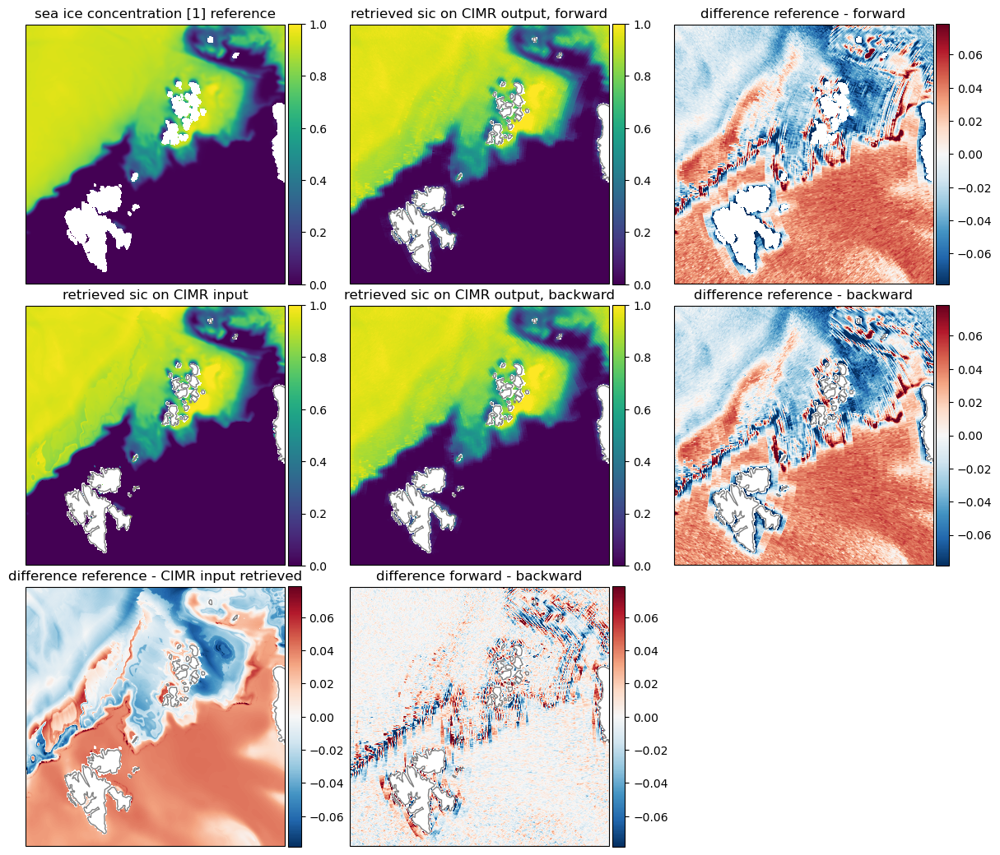

~~~markdown
```{figure} figures/figure_ref_comparison_sic.png
:name: ref_comparison_sic

Comparison of sea ice concentration [1] between reference dataset and retrieval Uppper row: reference, forward, difference to reference. Middle row: retrieved on CIMR input, backward, difference to reference. Lower row: difference between reference and retrieved, difference between forward and backward, empty
```

~~~

In [14]:

using Statistics
#DRAFT: plot reference, forward and backward with corresponding differences
#layout: 3x3, first row: reference, forward, difference to reference
#second row: retrieved on CIMR input, backward, difference to reference
#third row: difference bteween reference and retrieved, difference between forward and backward, empty

#reference is in variable gdata_true
#retrieved on CIMR input is in variable gdata
#retrieved on CIMR output is in variable data which is a Dict with keys "forward" and "backward"

#variable ranges

mmdict=Dict("ws"=>[0,20],"twv"=>[0,20],"clw"=>[0,0.5],"sst"=>[250,280],"ist"=>[250,280],"sic"=>[0,1],"myi"=>[0,1],"sit"=>[0,150],"sss"=>[25,40])

#variable names and units
labdict=Dict("ws"=>"wind speed [m/s]","twv"=>"total water vapor [kg/m²]","clw"=>"cloud liquid water [kg/m²]","sst"=>"sea surface temperature [K]","ist"=>"ice surface temperature [K]","sic"=>"sea ice concentration [1]","myi"=>"multi year ice fraction [1]","sit"=>"first year ice thickness [cm]","sss"=>"sea surface salinity [ppt]")

sic = getfield(gdata_true, :sic)

scene="polar"
#varname="twv"
for varname in ["sic"]#["ws","twv","clw","sst","ist","sic","myi","sit","sss"]

    #get variables from dicts for given varname
    reference = getfield(gdata_true,Symbol(varname))
    input_retrieved = getfield(gdatap,Symbol(varname))
    forward = getfield(data["forward"], Symbol(varname))
    backward = getfield(data["backward"], Symbol(varname))

    #calculate maximum min max for difference plot for comparison
    diffmax=max(quantile(filter(!isnan, abs.(forward - backward)[:]), 0.95),
    quantile(filter(!isnan, abs.(reference - backward)[:]), 0.95),
    quantile(filter(!isnan, abs.(reference - forward)[:]), 0.95),
    quantile(filter(!isnan, abs.(reference - input_retrieved)[:]), 0.95))

    #colorbar_orientation = "horizontal"
    colorbar_orientation = "vertical"

    mins, maxs = mmdict[varname]
    fig = pyplot.figure(figsize=(15, 13))
    #fig.suptitle(labdict[varname])

    # upper left: reference
    ax = fig.add_subplot(331, projection=ccrs)
    im = ax.imshow(reference, vmin=mins, vmax=maxs, extent=leaextent, transform=ccrs)
    ax.set_title("$(labdict[varname]) reference")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # upper middle: forward
    ax = fig.add_subplot(332, projection=ccrs)
    ax.set_title("retrieved $varname on CIMR output, forward")
    im = ax.imshow(forward, zorder=1, extent=leaextent, vmin=mins, vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # upper right: difference reference - forward
    ax = fig.add_subplot(333, projection=ccrs)
    ax.set_title("difference reference - forward")
    im = ax.imshow(reference - forward, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # middle left: input_retrieved
    ax = fig.add_subplot(334, projection=ccrs)
    ax.set_title("retrieved $varname on CIMR input")
    input_retrieved[landmask].=NaN
    im = ax.imshow(input_retrieved, zorder=1, extent=leaextent, vmin=mins, vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # middle middle: backward
    ax = fig.add_subplot(335, projection=ccrs)
    ax.set_title("retrieved $varname on CIMR output, backward")
    backward[landmask].=NaN
    im = ax.imshow(backward, zorder=1, extent=leaextent, vmin=mins, vmax=maxs)
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # middle right: difference reference - backward
    ax = fig.add_subplot(336, projection=ccrs)
    ax.set_title("difference reference - backward")
    im = ax.imshow(reference - backward, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    # lower left: difference reference - input_retrieved
    ax = fig.add_subplot(337, projection=ccrs)
    ax.set_title("difference reference - CIMR input retrieved")
    im = ax.imshow(reference - input_retrieved, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)
    
    # lower middle: difference forward - backward
    ax = fig.add_subplot(338, projection=ccrs)
    ax.set_title("difference forward - backward")
    im = ax.imshow(forward - backward, vmin=-diffmax, vmax=diffmax, extent=leaextent, transform=ccrs, cmap="RdBu_r")
    ax.coastlines(color="gray")
    pyplot.colorbar(im, orientation=colorbar_orientation, pad=0.01)

    #done
    #add space between subplots
    pyplot.subplots_adjust(wspace=0.05, hspace=0.08)

    plot_with_caption(fig, "Comparison of $(labdict[varname]) between reference dataset and retrieval Uppper row: reference, forward, difference to reference. Middle row: retrieved on CIMR input, backward, difference to reference. Lower row: difference between reference and retrieved, difference between forward and backward, empty", "ref_comparison_$(varname)")

end

## Correction of OZA variation

The SCEPS polar scene in the simulated CIMR L1b format shows a strong variation with the individual scans due to slight variation in OZA. As a first attempt we correct this variation empirically as described in {numref}`OZA` and apply the retrieval to the corrected data.

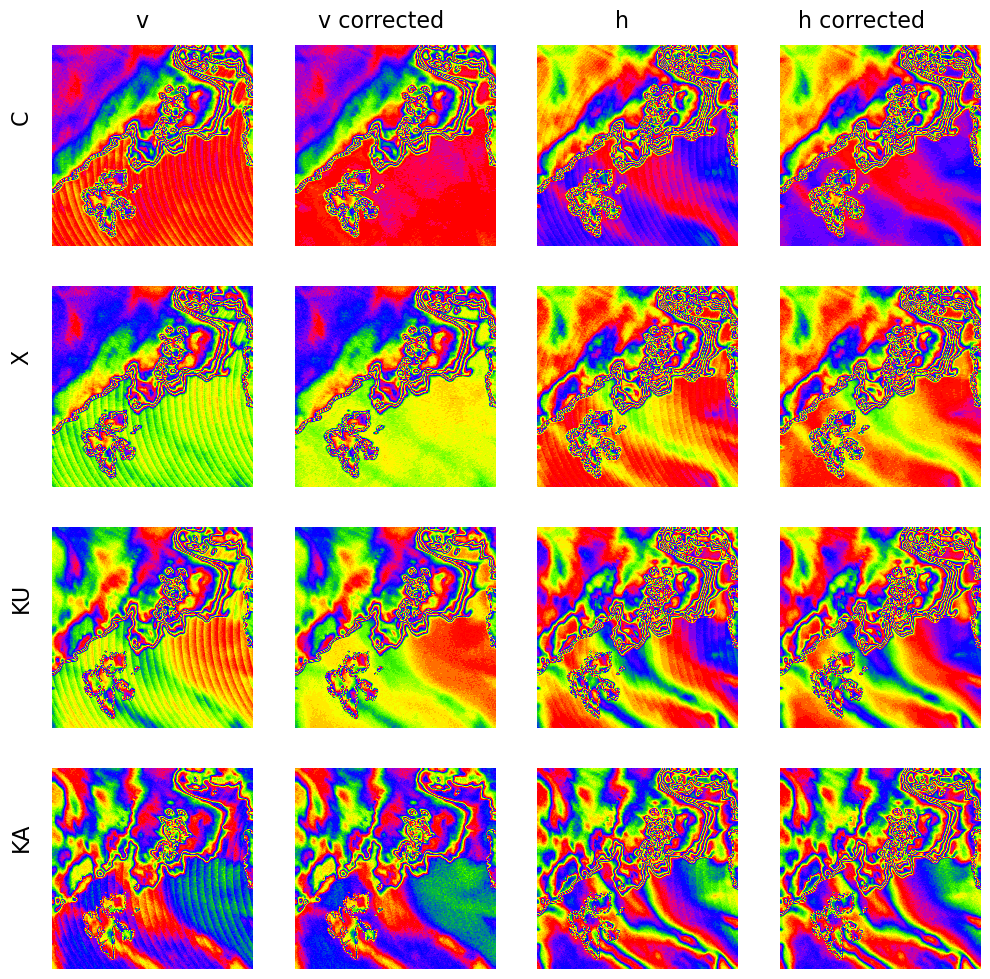

In [15]:
vmin=60
vmax=260
cmap = pyplot.cm.prism;
rows = ["v","v corrected","h","h corrected"]
let (fig,axs) = pyplot.subplots(4,4,figsize=[12,12])
    for (i,band) in enumerate(["C_BAND","X_BAND","KU_BAND","KA_BAND"])
        cbanddata=get_data_for_band(fns.scenep.l1b,band,"forward")
        cbanddata_corr=get_data_for_band(fns.scenep.l1b,band,"forward",oza_corr=true)
        lat, lon = cbanddata.lat, cbanddata.lon

        vproj=project_data_to_area_nn(cbanddata.v, lat, lon, lea)
        c=axs.flat[4*(i-1)+0].imshow(vproj,cmap=cmap,vmin=vmin,vmax=vmax)
        vproj=project_data_to_area_nn(cbanddata_corr.v, lat, lon, lea)
        c=axs.flat[4*(i-1)+1].imshow(vproj,cmap=cmap,vmin=vmin,vmax=vmax)
        vproj=project_data_to_area_nn(cbanddata.h, lat, lon, lea)
        c=axs.flat[4*(i-1)+2].imshow(vproj,cmap=cmap,vmin=vmin,vmax=vmax)
        vproj=project_data_to_area_nn(cbanddata_corr.h, lat, lon, lea)
        c=axs.flat[4*(i-1)+3].imshow(vproj,cmap=cmap,vmin=vmin,vmax=vmax)
        #pyplot.colorbar(c)
    end
    for i in 1:4
        fig.text(0.1, 0.82 - (i-1)*0.2, ["C","X","KU","KA"][i], va="center", ha="center", rotation="vertical", fontsize=16)
        fig.text(0.2 + (i-1)*0.2, 0.9,rows[i] , va="center", ha="center", fontsize=16)
    end
    for ax in axs.flat
        ax.axis("off")
    end
    display("image/png",fig)
end

The color map shown here is a cyclic color map where small differences are visible as changes in color, while the color has no meaning in terms of the absolute value as it occurs multiple times for different values. This is useful to illustrate small differences in homogeneous areas at different absolute values. In this case, the repetitive pattern of the OZA can be seen in the data in the vertical and horizontal polarization, while this pattern is mostly removed in the corrected data. Only in KA-band at vertical polarization the OZA pattern is still slightly visible at the bottom right part of the image.

In [16]:
scenepnc = Dict()
for dir in ["forward","backward"]
    test2datac,test2derror,lat,lon=project_data(fns.scenep.l1b,"C_BAND",dir)
    x,y=lltoxy.(lat,lon) |> x-> (first.(x),last.(x))
    pygc.collect()
    GC.gc()
    dat,err,res=run_oem(deepcopy(test2datac))
    scenepnc[dir] = (; dat, err, res, x, y, lat, lon)
end

Here we show the retrieval applied on the backward scan of the uncorrected data {numref}`uncorrected_all_params` and corrected {numref}`corrected_all_params` data as comparison. The scan lines are mainly visible in variables where small changes in brightness temperatures have a big impact on the retrieval result. It is least visible over high ice concentrations and thus in the multi year ice fraction and also in the sea ice concentration retrieval in general.

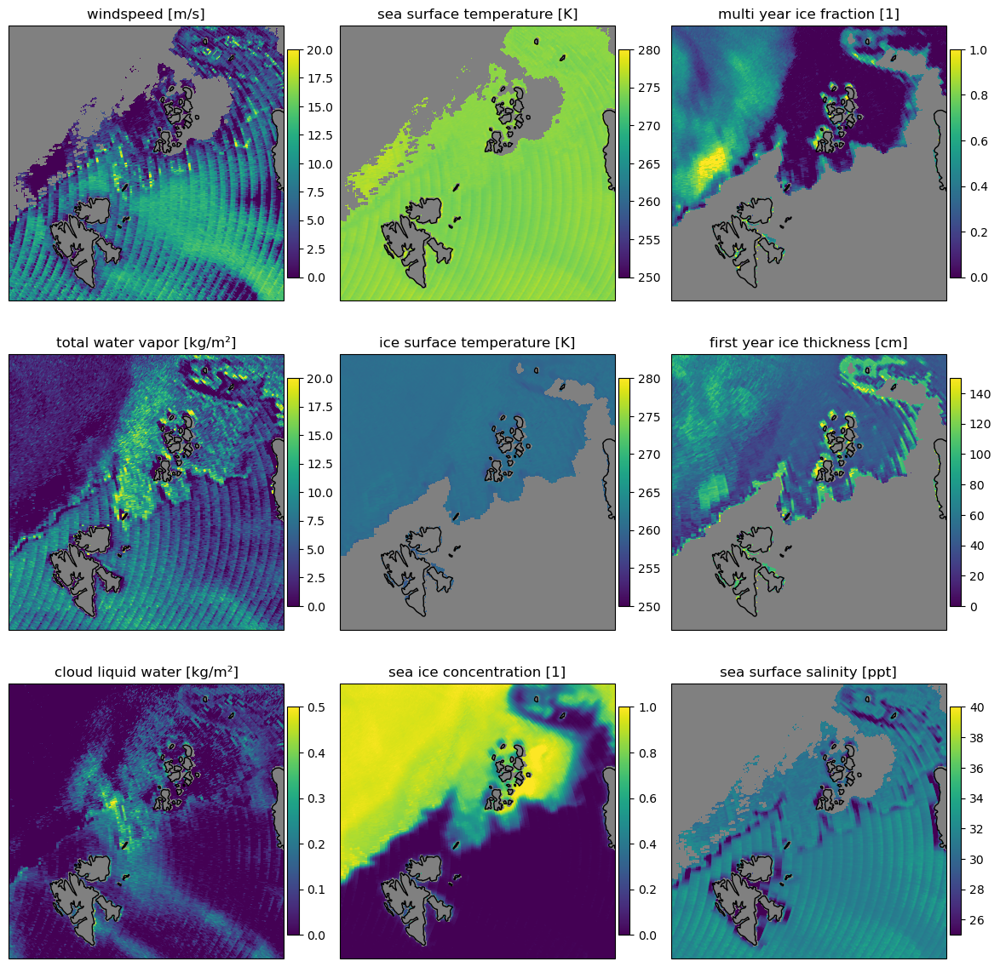

~~~markdown
```{figure} figures/figure_uncorrected_all_params.png
:name: uncorrected_all_params

The uncorrected data shows significant OZA variation in the retrieved quantities.
```

~~~

In [21]:
let fig = plot_all_params(scenepnc,"backward",swath=false,mask=(:sic,:land),errors=:false)
    description = "The uncorrected data shows significant OZA variation in the retrieved quantities."
    return plot_with_caption(fig,description,"uncorrected_all_params")
end

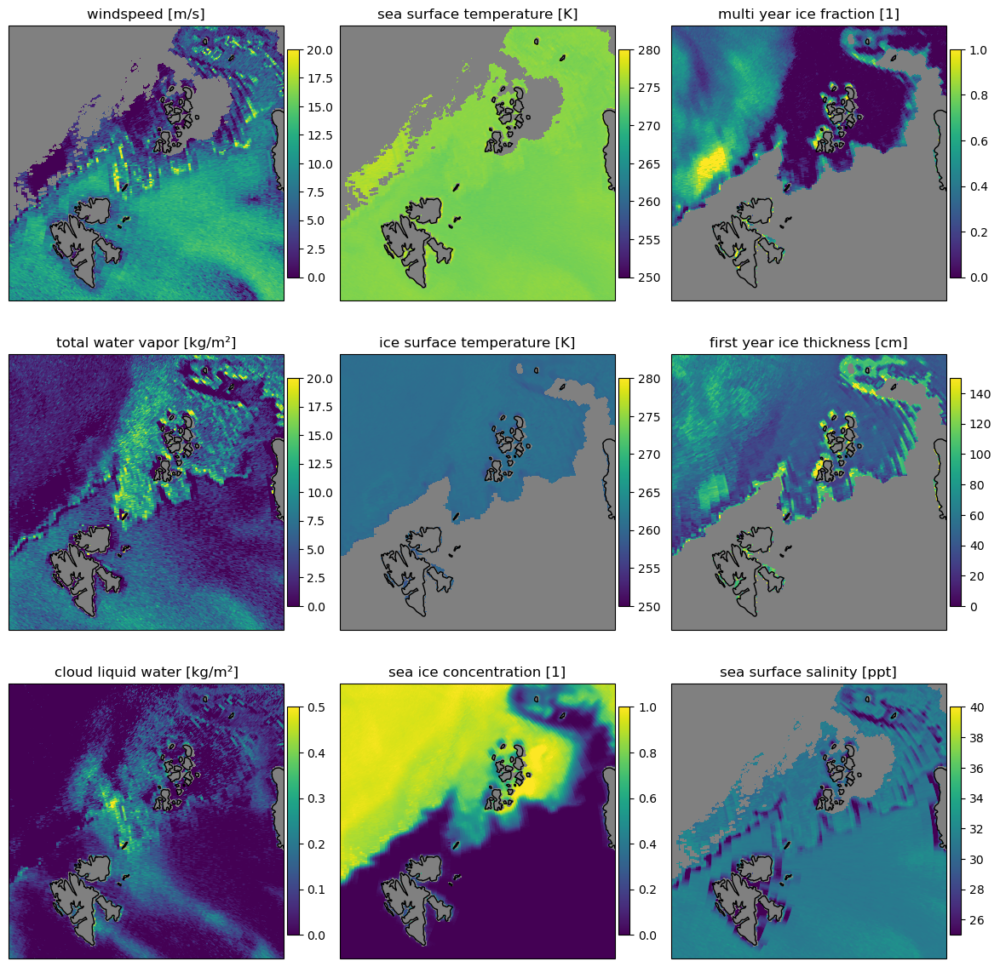

~~~markdown
```{figure} figures/figure_corrected_all_params.png
:name: corrected_all_params

The backward scan of the corrected data has less OZA variation and more consistent retrieval results compared to the uncorrected data.
```

~~~

In [22]:
let fig= plot_all_params(scenep,"backward",swath=false,mask=(:sic,:land),errors=:false)
    description = "The backward scan of the corrected data has less OZA variation and more consistent retrieval results compared to the uncorrected data."
    return plot_with_caption(fig,description,"corrected_all_params")
end

## Saving results (Example)

A few functions can be called to start the processing of CIMR L1b data and transform the result to a netCDF file. An example is shown here. We start with the `project_data` function to get to a common grid for all channels. On this we perform the retrieval using the `run_oem` function. The results are then stored in a named tuple with the with `data`, `err` and `lat` and `lon` keys for each viewing direction. This is stored for each viewing direction in another named tuple with the corresponding fields `forward` or `backward`. On this nested structure we can call the `store_output` function to save the results to a netCDF file.

In [20]:
# example to write out a file
#forward 
findata,finerror,flat,flon=project_data(fns.scene2.l1b,"C_BAND","forward")
fdat,ferr,_=run_oem(findata)#,deepcopy(finerror))
#backward
bindata,binerror,blat,blon=project_data(fns.scene2.l1b,"C_BAND","backward")
bdat,berr,_=run_oem(bindata)#,deepcopy(binerror)))

thedata=(;forward=(;data=fdat,err=ferr,lat=flat,lon=flon),
         backward=(;data=bdat,err=berr,lat=blat,lon=blon))

store_output("test2_forward.nc",thedata,"ease2_nh")


(xsize, ysize, length(x), length(y)) = (1440, 1440, 1440, 1440)


## Summary 

The Multi Parameter Retrieval \term{MPR}, has been demonstrated on the two CIMR
\term{DEVALGO} test cards, as well as on the SCEPS polar scene. For the two
DEVALGO test cards, the retrieval was applied on the input data to the CIMR
simulator, as well as on the L1b data, which is the output of the CIMR
simulator. This way of performance evaluation is used to assess the impact of
the satellite characteristics on the retrieval, in particular the combination
of different resolutions of the channels. As a performance metric for these
scene, the mean difference is calculated, which can be referred to as BIAS. In
addition the standard deviation of differences are assessed which is
technically the mean difference from the BIAS. The performance of the retrieval
on the L1b data is very similar to the performance on the input data. This is
expected as the simulator is slightly modifying the input brightness
temperatures. The differences are only visible at the ice edges and at the
intermediate ice concentration where slight scan pattern are visible from the
simulated L1b data. The performance of the retrieval on the SCEPS polar scene
is also very similar to the performance on the DEVALGO test cards.
The OZA variation in the SCEPS polar scene is corrected empirically and
the retrieval is applied to the corrected data. The visible scan lines from the
OZA variation are mainly removed in the all retrieved quantities on the OZA
corrected data. The addition of the sea surface salinity to the retrieval could
be accomplished but the sea surface salinity comes with a high uncertainty in
this retrieval. Interestingly, the retrieved SSS is showing the OZA pattern,
even though it is mostly influenced by L-band TBs which is most sensitive to
salinity. At L-band CIMR only observes with one single feed horn so that OZA
variation is not present for neighboring scan lines. The OZA pattern in the SSS
retrieval is propagating from the strong OZA effect on wind speed, which can be
seen in multiple frequencies, including KU-band and KA-band, where the OZA
effect is strongest. In the OZA corrected version, no pattern is visible in
the SSS retrieval. Additional work will need to be done to understand how this
OZA pattern propagates through different frequencies and what it means for
retrievals of other parameters such as wind speed or temperature. 
